# Lab: Build Neural Networks via Pytorch

The purpose of this assignment is to learn how to build neural networks using PyTorch, focusing on both the theoretical and practical aspects of the process.

One key step involves passing the output of a regression model through the Sigmoid function. This operation transforms the raw output (often called the logit) into a probability value between 0 and 1, which represents the likelihood of an observation belonging to the positive class.

This step is particularly important in binary classification tasks, as it allows us to interpret the model's predictions in probabilistic terms and enables subsequent evaluation using metrics such as accuracy or binary cross-entropy loss.

## Imports
<hr>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torchsummary import summary
from torch import nn, optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.datasets import make_regression, make_circles, make_blobs
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

## Neural Network Classification
<hr>

### 1. Binary Classification

We will build a binary classification model using PyTorch. The output of the regression model will be passed through the Sigmoid function to convert it into a value between 0 and 1, representing the probability that an observation belongs to the positive class.

#### PyTorch Tensor

Please convert your input data, X (features) and y (labels), into PyTorch tensors so they can be used with PyTorch models.

X_t and y_t are created as tensors with the data type torch.float32, which is required for most machine learning tasks in PyTorch.

In [84]:

X, y = make_circles(n_samples=300, factor=0.5, noise=0.1, random_state=2020)


# Your code for tensor
X_t = torch.tensor(X, dtype=torch.float32)
y_t = torch.tensor(y, dtype=torch.float32)


#### TensorDataset
Use PyTorch's TensorDataset and DataLoader to prepare the dataset for training, including batching and shuffling.

Requirements:

Combine X_t and y_t into a dataset using TensorDataset.

Use DataLoader to create batches of data for training. The batch size should be specified by the variable 45.
Enable shuffle=True in the DataLoader to randomize the order of data for each epoch.

In [85]:
# Create dataloader
# Your code for TensorDataset and dataloader
batchSize = 45


dataloader = DataLoader(TensorDataset(X_t, y_t), batch_size=batchSize, shuffle=True)

#### Visualize your circular dataset

Visualize your circular dataset with the following requirements:

- The figure size should be set to 5×5.
- Data points with y = 0 should be marked in blue, and those with y = 1 should be marked in red.
- Both the x-axis and y-axis labels should have a font size of 14.

<ipython-input-86-f58086d433d0>:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(fontsize=12)


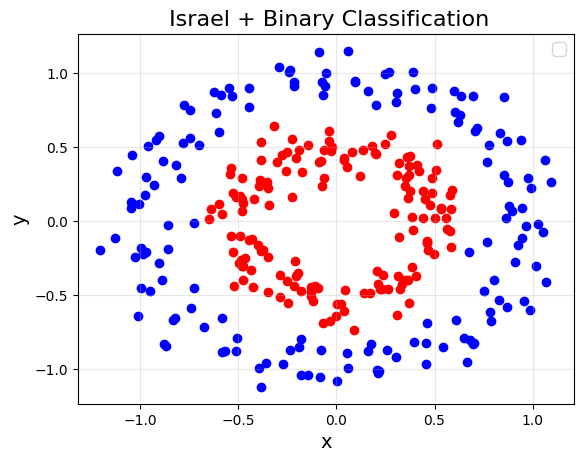

In [86]:

# Plot each class
# Your code plot with scatter

# Add Label and title
plt.title(" Israel + Binary Classification", fontsize=16)
# Your code set graph axises
plt.xlabel("x", fontsize=14)
plt.ylabel("y", fontsize=14)
plt.legend(fontsize=12)
plt.scatter(X[y==0, 0], X[y==0, 1], color='blue', label='0')
plt.scatter(X[y==1, 0], X[y==1, 1], color='red', label='1')
plt.grid(alpha=0.3)
plt.show()



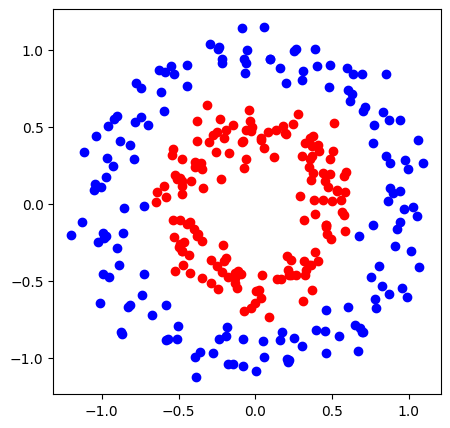

In [87]:
# Plot each class
# Example results
plt.figure(figsize=(5, 5))
plt.scatter(X[y==0, 0], X[y==0, 1], color='blue', label='0')
plt.scatter(X[y==1, 0], X[y==1, 1], color='red', label='1')

We're going to start using `ReLU` as our activation function(s) and `Adam` as our optimizer because these are what are currently, commonly used in practice. We are doing classification now so we'll need to use log loss (binary cross entropy) as our loss function:

$$f(w) = \sum_{x,y \in D} -y log(\hat{y}) - (1-y)log(1-\hat{y})$$

![image.png](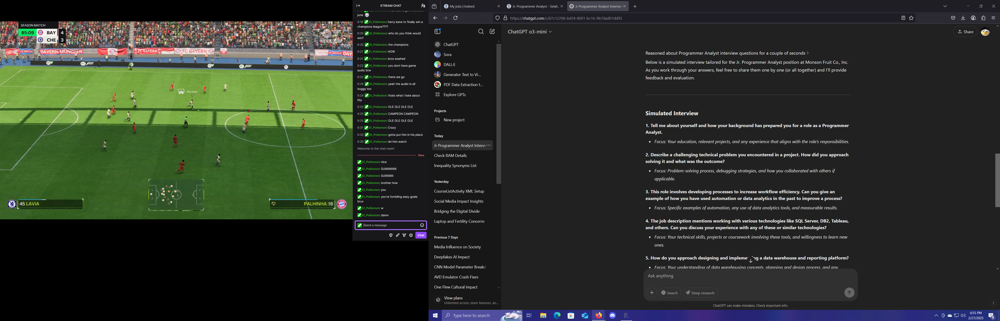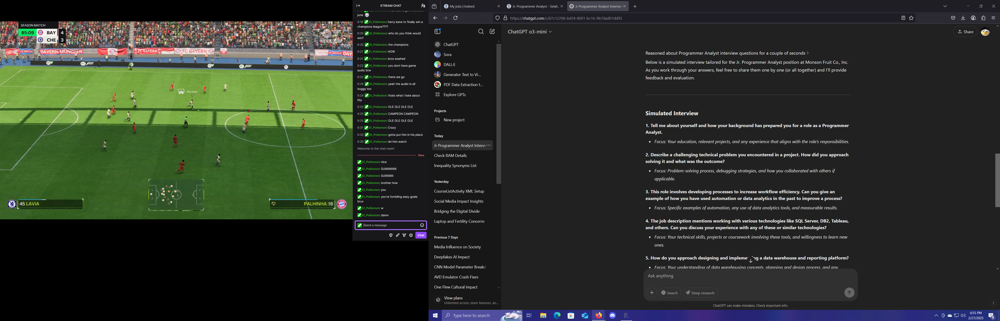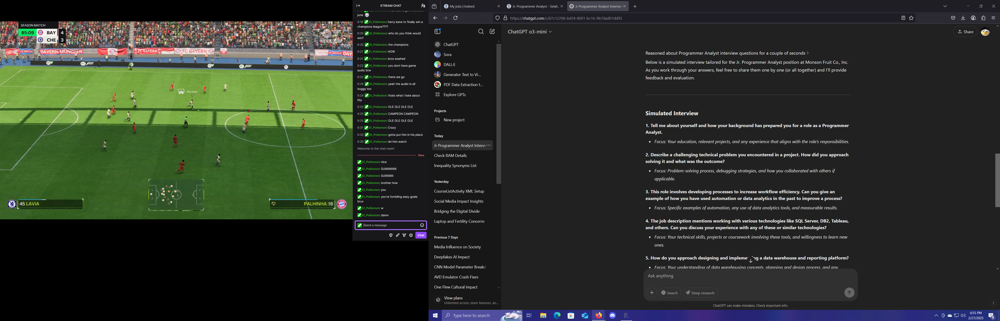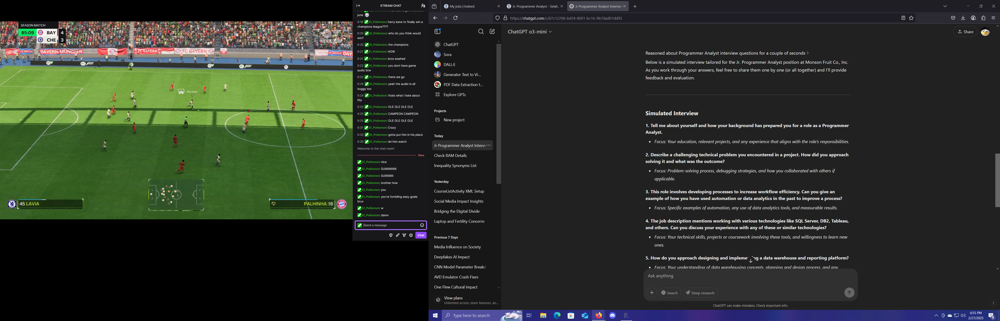)#### Create Neural Network

Implement a neural network class for binary classification using PyTorch's nn.Module.

- Create a fully connected layer that maps the input features to the hidden layer.
- Use Relu as activation
- Create another fully connected layer
- Use Sigmoid


In [88]:

class binaryClassifier(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super().__init__()
        self.main = nn.Sequential(
            nn.Linear(input_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, output_size),
            nn.Sigmoid()
        )

    def forward(self, x):
        out = self.main(x)
        return out

#### Build trainer

Implement a simple training wrapper for a PyTorch network that handles the forward pass, backpropagation, and parameter updates for multiple epochs.

Training Process:

Epoch Loop:
- Iterate over the specified number of epochs.

Batch Loop:
- Iterate over batches of X and y from the dataloader.
- Clear the gradients using optimizer.zero_grad().
- Perform a forward pass:
- Use the model to compute predictions (y_hat).
- Flatten the output to match the expected shape if necessary.
- Calculate the loss using criterion(y_hat, y).
- Perform backpropagation with loss to compute gradients.
- Update model parameters using optimizer.step().
- Accumulate the loss for the batch into a running total.

Logging:
- At the end of each epoch, compute and print the average loss over all batches if verbose is True.

In [89]:
def trainer(model, criterion, optimizer, dataloader, epochs=5, verbose=True):
    # You may review the ipynb file from Week 6

    # Your code
    for epoch in range(epochs):
        losses = 0
        for X, y in dataloader:
            optimizer.zero_grad()        # Clear gradients w.r.t. parameters
            y_hat = model(X).flatten()       # Forward pass to get output
            loss = criterion(y_hat, y)        # Calculate loss
            loss.backward()        # Getting gradients w.r.t. parameters
            optimizer.step()           # Update parameters
            losses += loss.item()       # Add loss for this batch to running total
        if verbose: print(f"epoch: {epoch + 1}, loss: {losses / len(dataloader):.4f}")

In PyTorch, the binary cross entropy loss criterion is `torch.nn.BCELoss`. The formula expects a "probability" which is why we add a Sigmoid function to the end of out network.

In [90]:
LEARNING_RATE = 0.1
criterion= torch.nn.BCELoss() # loss function - binary cross entropy loss
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE) # optimization algorithm - Adam

Let's train the model:

In [91]:
# Your code
# set your mode with 2 input layers, 6 hidden layers, and 1 output layers via binaryClassifier class
model = binaryClassifier(2, 6, 1)


#### Activation functions

We're going to using `ReLU` as our activation function(s) and `Adam` as our optimizer because these are what are currently, commonly used in practice. We are doing classification now so we'll need to use log loss (binary cross entropy) as our loss function:

$$f(w) = \sum_{x,y \in D} -y log(\hat{y}) - (1-y)log(1-\hat{y})$$

In PyTorch, the binary cross entropy loss criterion is `torch.nn.BCELoss`. The formula expects a "probability" which is why we add a Sigmoid function to the end of out network.

In [92]:
LEARNING_RATE = 0.1
criterion = torch.nn.BCELoss() # loss function
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)  # optimization algorithm

In [93]:
def trainer(model, criterion, optimizer, dataloader, epochs=30, verbose=True):
    loss_history = []
    for epoch in range(epochs):
        losses = 0
        for X, y in dataloader:
            optimizer.zero_grad()        # Clear gradients w.r
            y_hat = model(X)      # Forward

            # Reshape y_hat to match the shape of y:
            y_hat = y_hat.squeeze(1)  # Removes the extra dimension

            loss = criterion(y_hat, y)        # Calculate loss
            loss.backward()        # Getting gradients w.r.t. parameters
            optimizer.step()           # Update parameters
            losses += loss.item()   # Add loss for this batch to running total

            loss_history.append(loss.item())
        if verbose: print(f"epoch: {epoch + 1}, loss: {losses / len(dataloader):.4f}")
    return loss_history

#### Visualize your results

#### Part 1: Loss Curve

- Please plot the loss curve during training.
- Your graph needs to be labeled with x-axis, y-axis, and title.
- The title needs to include your first name.
- Your graph needs to have a legend and a grid.

epoch: 1, loss: 0.0955
epoch: 2, loss: 0.0889
epoch: 3, loss: 0.0904
epoch: 4, loss: 0.0823
epoch: 5, loss: 0.0818
epoch: 6, loss: 0.0814
epoch: 7, loss: 0.0843
epoch: 8, loss: 0.0756
epoch: 9, loss: 0.0803
epoch: 10, loss: 0.0739
epoch: 11, loss: 0.0788
epoch: 12, loss: 0.0732
epoch: 13, loss: 0.0707
epoch: 14, loss: 0.0718
epoch: 15, loss: 0.0684
epoch: 16, loss: 0.0683
epoch: 17, loss: 0.0672
epoch: 18, loss: 0.0632
epoch: 19, loss: 0.0606
epoch: 20, loss: 0.0620
epoch: 21, loss: 0.0613
epoch: 22, loss: 0.0580
epoch: 23, loss: 0.0620
epoch: 24, loss: 0.0649
epoch: 25, loss: 0.0601
epoch: 26, loss: 0.0568
epoch: 27, loss: 0.0591
epoch: 28, loss: 0.0569
epoch: 29, loss: 0.0559
epoch: 30, loss: 0.0572


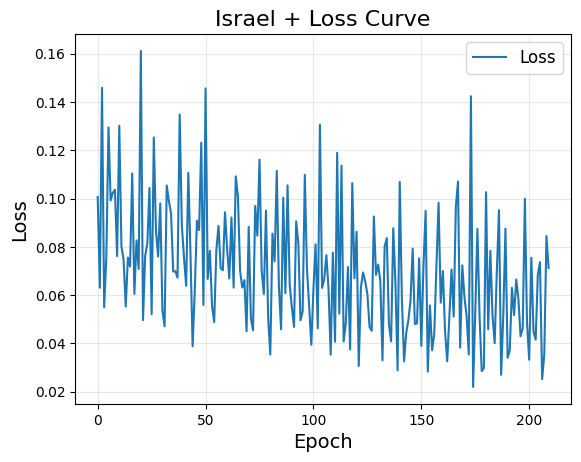

In [95]:
loss_history = trainer(model, criterion, optimizer, dataloader, epochs=30, verbose=True)
plt.plot(loss_history, label='Loss')
plt.title("Israel + Loss Curve", fontsize=16)
plt.xlabel("Epoch", fontsize=14)
plt.ylabel("Loss", fontsize=14)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.show()

### Part 2: Actual and predicted data

- Please plot the Actual and predicted data after training.
- Your graph needs to be labeled with x-axis, y-axis, and title.
- The title needs to include your first name.
- Your graph needs to have a legend and a grid.

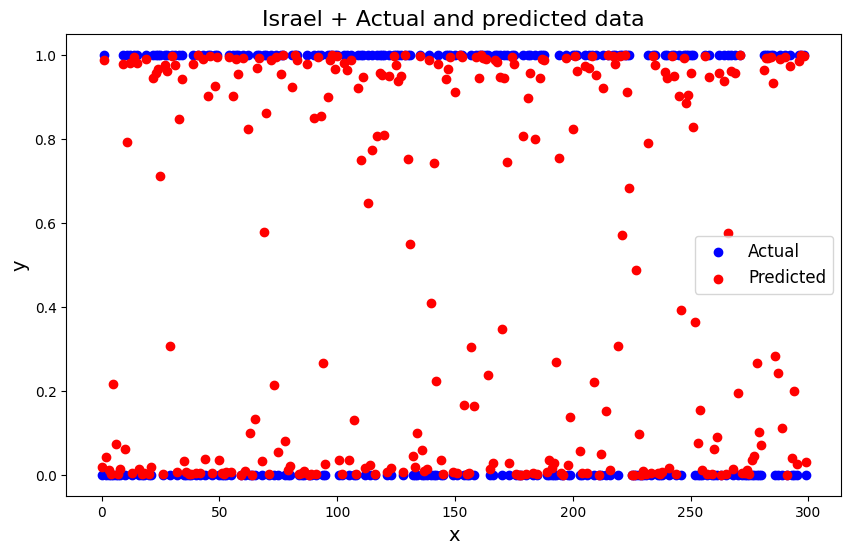

In [ ]:
actual_data = []
predicted_data = []

model.eval()

with torch.no_grad():
    for X, y in dataloader:
        y_hat = model(X)  # Get prediction

        actual_data.extend(y.numpy())  # Actual values
        predicted_data.extend(y_hat.numpy()) # Predicted values

# Plotting Actual vs Predicted
plt.figure(figsize=(10, 6))
plt.scatter(range(len(actual_data)), actual_data, color='blue', label='Actual')
plt.scatter(range(len(predicted_data)), predicted_data, color='red', label='Predicted')


plt.title("Israel + Actual and predicted data", fontsize=16)
plt.xlabel("x", fontsize=14)
plt.ylabel("y", fontsize=14)
plt.legend(fontsize=12)

To be clear, our model is just outputting some number between -1 and +1 (we are applying Sigmoid in the model), so:
- To get the probabilities we would need to pass them through a Sigmoid;
- To get classes, we can apply some threshold (usually 0.5) to this probability.

For example, we would expect the point (0,0) to have a high probability and the point (-1,-1) to have a low probability:

In [ ]:
prediction = model(torch.tensor([0., 0.], dtype=torch.float32))
print(prediction)

tensor([0.9996], grad_fn=<SigmoidBackward0>)


In [ ]:
probability = torch.sigmoid(prediction)
print(probability)

tensor([0.7310], grad_fn=<SigmoidBackward0>)


In [ ]:
classes = np.where(probability > 0.5, 1, 0)
print(classes)

[1]


### 2. Multiclass Classification

For multiclass classification, we'll need the softmax function:

$$\sigma(\vec{z})_i=\frac{e^{z_i}}{\sum_{j=1}^{K}e^{z_j}}$$

It basically outputs probabilities for each class we wish to predict, and they all sum to 1.

`torch.nn.CrossEntropyLoss` is a loss that combines a softmax with cross entropy loss.

Let's try a 4-class classification problem using the following network:


In [ ]:
X, y = make_blobs(n_samples=200, centers=4, center_box=(-1.2, 1.2), cluster_std=[0.15, 0.15, 0.15, 0.15], random_state=12345)
X_t = torch.tensor(X, dtype=torch.float32)
y_t = torch.tensor(y, dtype=torch.long)

# Create dataloader
dataset = TensorDataset(X_t, y_t)
dataloader = DataLoader(dataset, batch_size=45, shuffle=True)

In [ ]:
class multiClassifier(torch.nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super().__init__()
        self.main = torch.nn.Sequential(
            torch.nn.Linear(input_size, hidden_size),
            torch.nn.ReLU(),
            torch.nn.Linear(hidden_size, output_size)
        )

    def forward(self, x):
        out = self.main(x)
        return out

#### Visualize your circular dataset

Visualize your circular dataset with the following requirements:

- The figure size should be set to 5×5.
- Both the x-axis and y-axis labels should have a font size of 14.

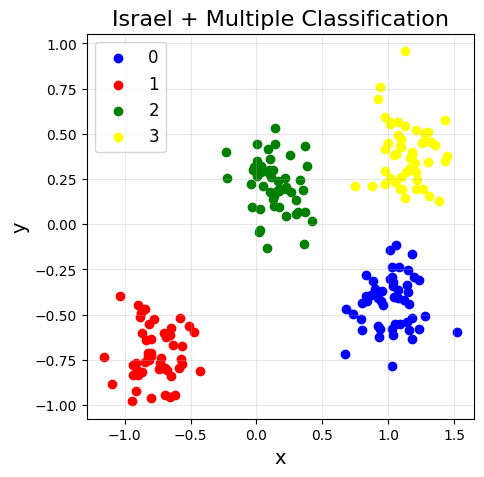

In [ ]:
# Plot each class
# Your code plot with scatter
plt.figure(figsize=(5, 5))
plt.scatter(X[y==0, 0], X[y==0, 1], color='blue', label='0')
plt.scatter(X[y==1, 0], X[y==1, 1], color='red', label='1')
plt.scatter(X[y==2, 0], X[y==2, 1], color='green', label='2')
plt.scatter(X[y==3, 0], X[y==3, 1], color='yellow', label='3')

# Add Label and title
plt.title("Israel + Multiple Classification", fontsize=16)

plt.xlabel("x", fontsize=14)
plt.ylabel("y", fontsize=14)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.show()

Let's train this model:

In [ ]:
model_2 = multiClassifier(2, 6, 4)

# Your code
# loss function with CrossEntropyLoss
criterion = torch.nn.CrossEntropyLoss()

# optimization algorithm - Adam lr=0.2
optimizer = torch.optim.Adam(model_2.parameters(), lr=0.2)

accuracy_history = []
for epoch in range(10):
    losses = 0
    correct = 0
    total = 0
    for X_batch, y_batch in dataloader:
        optimizer.zero_grad()
        y_hat = model_2(X_batch)
        loss = criterion(y_hat, y_batch)    # Calculate loss
        loss.backward()                 # Getting gradients
        optimizer.step()
        losses += loss.item()           # Add loss for this batch to running total

        #calcuate accuracy
        _, predicted = torch.max(y_hat, 1)
        correct += (predicted == y_batch).sum().item()
        total += y_batch.size(0)

    accuracy = correct / total
    accuracy_history.append(accuracy)

    print(f"epoch: {epoch + 1}, loss: {losses / len(dataloader):.4f}")

epoch: 1, loss: 1.1345
epoch: 2, loss: 0.6438
epoch: 3, loss: 0.4405
epoch: 4, loss: 0.2746
epoch: 5, loss: 0.1251
epoch: 6, loss: 0.0351
epoch: 7, loss: 0.0172
epoch: 8, loss: 0.0085
epoch: 9, loss: 0.0047
epoch: 10, loss: 0.0034


#### Visualize your results

### Part 3: Accuracy Curve for 4 classes

- Please plot the Accuracy Curve during training.
- Your graph needs to be labeled with x-axis, y-axis, and title.
- The title needs to include your first name.
- Your graph needs to have a legend and a grid.

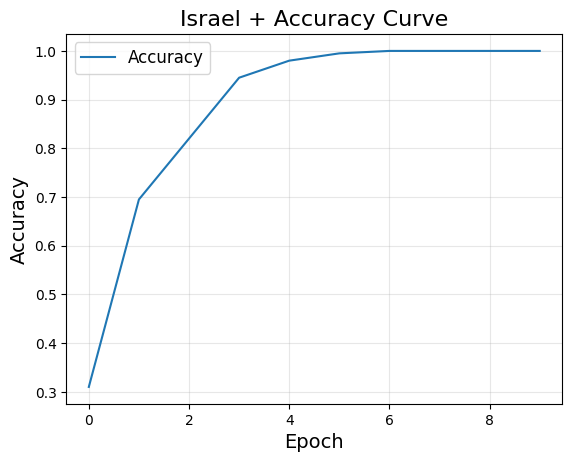

In [ ]:
plt.plot(accuracy_history, label='Accuracy')
plt.title("Israel + Accuracy Curve", fontsize=16)
plt.xlabel("Epoch", fontsize=14)
plt.ylabel("Accuracy", fontsize=14)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.show()

### Part 4: Actual and predicted data for classes

- Please plot the Actual and predicted data after training.
- Your graph needs to be labeled with x-axis, y-axis, and title.
- The title needs to include your first name.
- Your graph needs to have a legend and a grid.

<ipython-input-79-ca297714bf07>:6: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_t.detach().numpy()[:, 0], X_t.detach().numpy()[:, 1], c=y_pred_normalized.detach().numpy(), cmap='viridis', marker='x', alpha=0.8, label='Predicted')


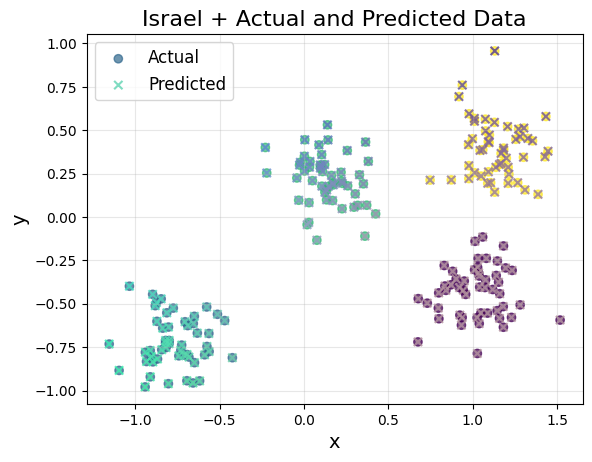

In [ ]:
# Plot Actual Data
plt.scatter(X_t.detach().numpy()[:, 0], X_t.detach().numpy()[:, 1], c=y, marker='o', alpha=0.7, label='Actual')

# Plot Predicted Data (overlay)
y_pred_normalized = (y_pred - y_pred.min()) / (y_pred.max() - y_pred.min())
plt.scatter(X_t.detach().numpy()[:, 0], X_t.detach().numpy()[:, 1], c=y_pred_normalized.detach().numpy(), cmap='viridis', marker='x', alpha=0.8, label='Predicted')
plt.title("Israel + Actual and Predicted Data", fontsize=16)
plt.xlabel("x", fontsize=14)
plt.ylabel("y", fontsize=14)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)

# Show plot
plt.show()